## Proyecto de ACUS 220
### Modelo de clasificación de escenas acústicas

### 1. Preparación del espacio de trabajo

Crear un entorno de conda utilizando environment.yml o crear un entorno instalando: python=3.10, numpy, scipy, matplotlib, librosa, soundfile y pyaudio.

In [1]:
# Dependencias
import os
import pandas as pd
import numpy as np
import torch
import librosa
import librosa.display
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import TensorDataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from IPython.display import Audio, display

### 2. Introducción y carga de datos

El objetivo es crear, entrenar y evaluar un modelo que clasifique escenas de vehículos, interiores y exteriores usando el conjunto TUT Acoustic Scenes 2016 - Task 1, para posteriormente usar este modelo entrenado para probarlos con audios grabados manualmente.

#### Exploración de los audios disponibles

A continuación tenemos un código que nos muestra a qué escena corresponde cada uno de los audios

In [2]:
# Ruta de tu carpeta de audios y del meta.txt
audio_dir = 'audio'
meta_path = 'meta.txt'

# Leer meta.txt (puede ser tab o espacio; se adapta automáticamente)
meta = pd.read_csv(meta_path, sep='\s+', header=None, names=['file', 'scene'])

# Listar los archivos que tienes realmente en la carpeta audio
audio_files = os.listdir(audio_dir)
audio_files = [f for f in audio_files if f.endswith('.wav')]

# Obtener solo el nombre base (por si meta.txt tiene subcarpetas)
meta['basename'] = meta['file'].apply(os.path.basename)

# Filtrar solo las filas de meta que correspondan a los audios que tienes descargados
meta_subset = meta[meta['basename'].isin(audio_files)].copy()

# Contar cuántos archivos tienes por escena
scene_counts = meta_subset['scene'].value_counts()

# Mostrar resultados
print("Cantidad de audios disponibles por tipo de escena:\n")
print(scene_counts)

Cantidad de audios disponibles por tipo de escena:

scene
tram                38
residential_area    37
metro_station       34
grocery_store       33
library             32
home                32
beach               31
train               31
cafe/restaurant     30
car                 30
bus                 29
park                29
city_center         28
office              28
forest_path         26
Name: count, dtype: int64


In [3]:
# --- Definir las categorías ---
exteriores = ['city_center', 'forest_path', 'beach', 'residential_area', 'park']
interiores = ['cafe/restaurant', 'grocery_store', 'home', 'library', 'metro_station', 'office']
vehiculos  = ['bus', 'car', 'train', 'tram']

# --- Crear un diccionario de mapeo ---
scene_to_group = {}

for s in exteriores:
    scene_to_group[s] = 'Exteriores'
for s in interiores:
    scene_to_group[s] = 'Interiores'
for s in vehiculos:
    scene_to_group[s] = 'Vehículos'

# --- Aplicar el mapeo a tu DataFrame filtrado ---
meta_subset['grupo'] = meta_subset['scene'].map(scene_to_group)

# --- Contar cuántos audios tienes en cada grupo ---
group_counts = meta_subset['grupo'].value_counts()

print("Cantidad de audios por tipo de entorno:\n")
print(group_counts)

Cantidad de audios por tipo de entorno:

grupo
Interiores    189
Exteriores    151
Vehículos     128
Name: count, dtype: int64


#### Carga de audios de ejemplo

A continuación se muestran tres escenas:
- Playa (exterior)
- Oficina (Interior)
- Tren (Vehículo)

In [4]:
# Carga de algunos archivos de audio de carpeta /audio

path_audio_1 = 'audio/a014_60_90.wav'
path_audio_2 = 'audio/b113_270_300.wav'
path_audio_3 = 'audio/a075_30_60.wav'

y1, sr = librosa.load(path_audio_1, sr=None)
y2, sr = librosa.load(path_audio_2, sr=None)
y3, sr = librosa.load(path_audio_3, sr=None)

# Carga de meta.txt

meta = pd.read_csv('meta.txt', sep='\t', header=None, names=['file', 'scene'])

# Función para obtener etiqueta de meta.txt
def get_scene_label(meta_df, audio_path):
    # Obtener solo el nombre del archivo, por si hay diferencias de ruta
    file_name = os.path.basename(audio_path)
    
    # Buscar coincidencia en la columna 'file'
    row = meta_df[meta_df['file'].str.contains(file_name)]
    
    if not row.empty:
        return row['scene'].values[0]
    else:
        return "Etiqueta no encontrada"

# Obtener etiquetas
label1 = get_scene_label(meta, path_audio_1)
label2 = get_scene_label(meta, path_audio_2)
label3 = get_scene_label(meta, path_audio_3)

print(f"{path_audio_1} → {label1}")
display(Audio(y1, rate=sr))

print(f"{path_audio_2} → {label2}")
display(Audio(y2, rate=sr))

print(f"{path_audio_3} → {label3}")
display(Audio(y3, rate=sr))


audio/a014_60_90.wav → beach


audio/b113_270_300.wav → office


audio/a075_30_60.wav → train


A continuación está el **espectrograma log-mel** del primer audio. Este tipo de representación será la utilizada por el modelo durante el entrenamiento.

El **espectrograma log-mel** es una variante del espectrograma clásico y es ampliamente usado en el procesamiento del audio y en tareas de aprendizaje automático.

Primero se aplica la **transformada de Fourier de corto tiempo (STFT)** para obtener la distribución de energía a lo largo del tiempo y la frecuencia. Luego, el eje de frecuencia se convierte a la **escala mel**, que imita la percepción humana del sonido otorgando mayor resolución en frecuencias bajas y menor en altas. Finalmente, se aplica una **transformación logarítmica** para reducir las grandes diferencias de magnitud entre frecuencias y facilitar el aprendizaje del modelo.

En este tipo de espectrograma:
- El eje Y ya no se expresa en hercios (Hz) reales, sino en bandas mel.
- Los valores representan energías logarítmicas (dB).


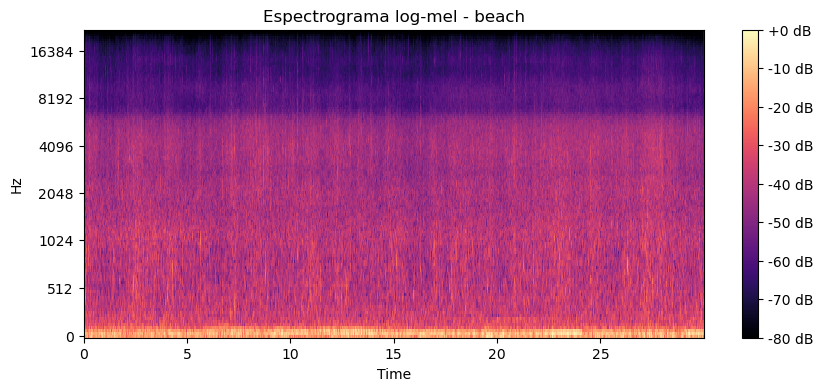

In [5]:
mel = librosa.feature.melspectrogram(y=y1, sr=sr, n_mels=128)
log_mel = librosa.power_to_db(mel, ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(log_mel, sr=sr, x_axis='time', y_axis='mel')
plt.title(f'Espectrograma log-mel - {label1}')
plt.colorbar(format='%+2.0f dB')
plt.show()

### 3. Extracción de características

A continuación se hará la extracción de características, en este caso se guardarán los escpectrogramas log-mel para cada archivo de audio en las carpetas: exterior, interior y vehículo.

In [6]:
# Carpeta de audios
meta_path = "meta.txt"
output_folder = "features_logmel"
os.makedirs(output_folder, exist_ok=True)

# Mapeo de escenas a grupos
scene_to_group = {
    # Exteriores
    'city_center': 'exterior',
    'forest_path': 'exterior',
    'beach': 'exterior',
    'residential_area': 'exterior',
    'park': 'exterior',

    # Interiores
    'cafe/restaurant': 'interior',
    'grocery_store': 'interior',
    'home': 'interior',
    'library': 'interior',
    'metro_station': 'interior',
    'office': 'interior',

    # Vehículos
    'bus': 'vehiculo',
    'car': 'vehiculo',
    'train': 'vehiculo',
    'tram': 'vehiculo'
}

# Cargar meta
meta = pd.read_csv(meta_path, sep='\t')
meta.columns = ['filename', 'scene']
meta['group'] = meta['scene'].map(scene_to_group)


# Parámetros
sr = 22050             # frecuencia de muestreo
n_mels = 64            # Cantidad de bandas mel
hop_length = 512       # Avance entre ventanas sucesivas de STFT
n_fft = 1024           #  Tamaño de la ventana de STFT

# === PROCESAR AUDIOS ===
processed = 0
skipped_missing = 0
skipped_unknown = 0

for i, row in meta.iterrows():
    filename_in_meta = row['filename']            # p.ej. "audio/a001_90_120.wav"
    group = row['group']

    # Saltar escenas sin grupo definido
    if pd.isna(group):
        skipped_unknown += 1
        continue

    # Ruta al archivo de audio (usamos la ruta tal como está en meta.txt)
    audio_path = filename_in_meta

    if not os.path.exists(audio_path):
        # Si tu carpeta local es 'audio/' pero el meta tiene 'audio/...' y el cwd distinto,
        # intenta con basename en la carpeta 'audio' local:
        alt_path = os.path.join('audio', os.path.basename(filename_in_meta))
        if os.path.exists(alt_path):
            audio_path = alt_path
        else:
            skipped_missing += 1
            continue

    # Crear subcarpeta por grupo
    group_folder = os.path.join(output_folder, group)
    os.makedirs(group_folder, exist_ok=True)

    # Cargar y generar log-mel spectrograma
    y, sr = librosa.load(audio_path, sr=sr)
    mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels,
                                              n_fft=n_fft, hop_length=hop_length)
    log_mel_spec = librosa.power_to_db(mel_spec, ref=np.max)

    # Guardar usando sólo el basename (sin "audio/" prefijo)
    base_name = os.path.basename(filename_in_meta).replace(".wav", ".npy")
    output_path = os.path.join(group_folder, base_name)
    np.save(output_path, log_mel_spec)

    processed += 1

print(f"Procesados: {processed}")
print(f"Ignorados (archivo faltante): {skipped_missing}")
print(f"Ignorados (escena sin grupo): {skipped_unknown}")
print("Archivos guardados en:", output_folder)

Procesados: 468
Ignorados (archivo faltante): 701
Ignorados (escena sin grupo): 0
Archivos guardados en: features_logmel


### 4. Entrenamiento

a) Preparación del dataset

1. **Definición de variables:** Se definieron las variables X e y, donde X contiene las características extraídas de los audios (log-mel espectrogramas) y y las etiquetas correspondientes a cada categoría (0 = exterior, 1 = interior, 2 = vehiculo).

2. **División del dataset:** El conjunto de datos se dividió en tres subconjuntos:

- Entrenamiento (train): utilizado para ajustar los pesos internos del modelo durante el aprendizaje.
- Validación (val): empleado al final de cada época para evaluar el modelo con datos no vistos y prevenir el sobreajuste (overfitting).
- Prueba (test): se utiliza al finalizar el entrenamiento, con el fin de obtener una medida objetiva del rendimiento final del modelo sobre datos completamente nuevos.

3. **Conversión a tensores y creación de DataLoaders:** Los subconjuntos se transformaron en tensores con la forma esperada por una CNN: (batch, canal, alto, ancho). Además, se usaron DataLoaders para dividir los datos en lotes, para así facilitar el procesamiento en GPU y estabilizar la convergencia durante el entrenamiento.

In [7]:
# Configuración
data_dir = "features_logmel"
classes = ["exterior", "interior", "vehiculo"]
label_map = {cls: i for i, cls in enumerate(classes)}  # {'exterior':0, 'interior':1, 'vehiculo':2}

# Recolectar datos
X = []
y = []

for cls in classes:
    cls_folder = os.path.join(data_dir, cls)
    files = [f for f in os.listdir(cls_folder) if f.endswith(".npy")]
    for file in files:
        path = os.path.join(cls_folder, file)
        feature = np.load(path)
        X.append(feature)
        y.append(label_map[cls])

X = np.array(X)
y = np.array(y)

print("Total de muestras:", len(X))
for cls, idx in label_map.items():
    print(f"{cls}: {(y == idx).sum()} muestras")

# Dividir dataset en train (70%), val (15%) y test (15%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

print(f"Train: {len(X_train)}, Val: {len(X_val)}, Test: {len(X_test)}")

# Convertir a tensores
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).unsqueeze(1)
X_val_tensor   = torch.tensor(X_val, dtype=torch.float32).unsqueeze(1)
X_test_tensor  = torch.tensor(X_test, dtype=torch.float32).unsqueeze(1)

y_train_tensor = torch.tensor(y_train, dtype=torch.long)
y_val_tensor   = torch.tensor(y_val, dtype=torch.long)
y_test_tensor  = torch.tensor(y_test, dtype=torch.long)

# Crear DataLoaders
batch_size = 32
train_loader = DataLoader(TensorDataset(X_train_tensor, y_train_tensor), shuffle=True, batch_size=batch_size)
val_loader   = DataLoader(TensorDataset(X_val_tensor, y_val_tensor), shuffle=False, batch_size=batch_size)
test_loader  = DataLoader(TensorDataset(X_test_tensor, y_test_tensor), shuffle=False, batch_size=batch_size)

print("Datasets y DataLoaders creados correctamente.")


Total de muestras: 468
exterior: 151 muestras
interior: 189 muestras
vehiculo: 128 muestras
Train: 327, Val: 70, Test: 71
Datasets y DataLoaders creados correctamente.


b) Implementación de la red neuronal

- Modelo: Se implementó una red neuronal convolucional (CNN) diseñada para procesar espectrogramas. El modelo está compuesto por varias capas convolucionales con activaciones ReLU y operaciones de pooling, seguidas por capas totalmente conectadas (fully connected).
Este tipo de arquitectura permite que la red aprenda patrones espaciales y temporales presentes en los espectrogramas, logrando distinguir entre entornos interiores, exteriores y vehículos.
    - Capas convolucionales (Conv2D): detectan patrones locales (bordes, texturas, modulaciones en tiempo o frecuencia).
    - ReLU + Pooling: reducen dimensionalidad y mantienen solo las características más relevantes.
    - Flatten + Fully Connected: integran toda la información y la transforman en una predicción final.
    - Dropout: previene el sobreajuste (importante en datasets pequeños).
- Función de pérdida: Se utilizó CrossEntropyLoss, adecuada para problemas de clasificación multiclase. 
- Optimizador: Se empleó el optimizador Adam, que funciona bien para CNNs.

In [8]:
# Número de clases (exterior, interior, vehiculo)
n_classes = 3

class CNN_Acustica(nn.Module):
    def __init__(self, n_classes):
        super(CNN_Acustica, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.AdaptiveAvgPool2d((4, 4)),
            nn.Flatten(),
            nn.Linear(64 * 4 * 4, 128), nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(128, n_classes)
        )

    def forward(self, x):
        return self.net(x)

# Crear el modelo
model = CNN_Acustica(n_classes)

# Función de pérdida
criterion = nn.CrossEntropyLoss()

# Optimizador
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)

CNN_Acustica(
  (net): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): AdaptiveAvgPool2d(output_size=(4, 4))
    (9): Flatten(start_dim=1, end_dim=-1)
    (10): Linear(in_features=1024, out_features=128, bias=True)
    (11): ReLU()
    (12): Dropout(p=0.3, inplace=False)
    (13): Linear(in_features=128, out_features=3, bias=True)
  )
)


c) Entrenamiento

In [9]:
# Parámetros
num_epochs = 35
train_losses = []
val_losses = []

# Bucle de entrenamiento
for epoch in range(num_epochs):
    model.train()  # Modo entrenamiento
    running_loss = 0.0
    
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Evaluar en validación
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
    
    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    
    print(f"Época {epoch+1}/{num_epochs} - Pérdida entrenamiento: {avg_train_loss:.4f} - Validación: {avg_val_loss:.4f}")

# Guardar el modelo completo (solo los pesos)
torch.save(model.state_dict(), "modelo_cnn.pth")
print("Modelo guardado en 'modelo_cnn.pth'")

Época 1/35 - Pérdida entrenamiento: 1.5511 - Validación: 1.1068
Época 2/35 - Pérdida entrenamiento: 1.0959 - Validación: 1.0916
Época 3/35 - Pérdida entrenamiento: 1.0943 - Validación: 1.0796
Época 4/35 - Pérdida entrenamiento: 1.0934 - Validación: 1.0691
Época 5/35 - Pérdida entrenamiento: 1.0811 - Validación: 1.0789
Época 6/35 - Pérdida entrenamiento: 1.0897 - Validación: 1.0835
Época 7/35 - Pérdida entrenamiento: 1.0715 - Validación: 1.0556
Época 8/35 - Pérdida entrenamiento: 1.0172 - Validación: 1.0462
Época 9/35 - Pérdida entrenamiento: 0.9168 - Validación: 2.6429
Época 10/35 - Pérdida entrenamiento: 1.1665 - Validación: 0.9972
Época 11/35 - Pérdida entrenamiento: 1.0003 - Validación: 0.9159
Época 12/35 - Pérdida entrenamiento: 0.9250 - Validación: 0.8430
Época 13/35 - Pérdida entrenamiento: 0.8808 - Validación: 0.8116
Época 14/35 - Pérdida entrenamiento: 0.8364 - Validación: 0.7235
Época 15/35 - Pérdida entrenamiento: 0.7747 - Validación: 0.7047
Época 16/35 - Pérdida entrenamient

### 5. Evaluación

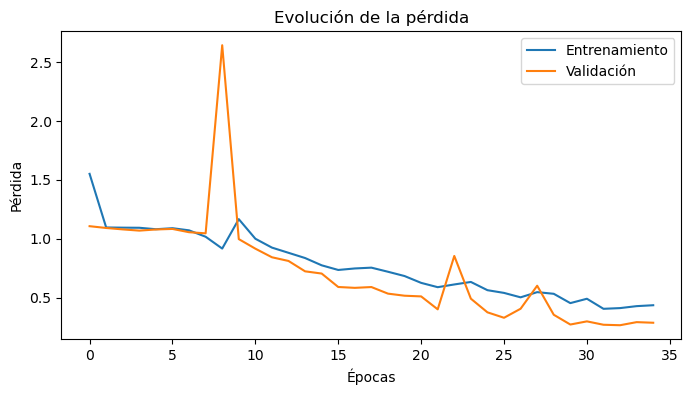

In [10]:
plt.figure(figsize=(8,4))
plt.plot(train_losses, label="Entrenamiento")
plt.plot(val_losses, label="Validación")
plt.xlabel("Épocas")
plt.ylabel("Pérdida")
plt.title("Evolución de la pérdida")
plt.legend()
plt.show()

In [11]:
# Precicisión
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)  # clase con mayor probabilidad
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Calcular accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Precisión total del modelo: {accuracy*100:.2f}%")

Precisión total del modelo: 88.73%


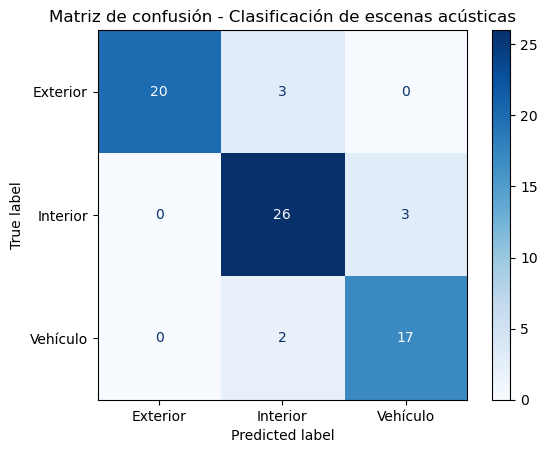

In [12]:
# Etiquetas de tus clases (en el mismo orden que en el entrenamiento)
labels_names = ["Exterior", "Interior", "Vehículo"]

# Matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Mostrar
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_names)
disp.plot(cmap='Blues', values_format='d')
plt.title("Matriz de confusión - Clasificación de escenas acústicas")
plt.show()

### Segunda parte

a) Grabar audio de la vida real y probar el modelo

In [13]:
grabaciones_folder = "grabaciones"

sr = 22050
n_mels = 64
hop_length = 512
n_fft = 1024

labels_names = ["Exterior", "Interior", "Vehículo"]

model_path = "modelo_cnn.pth"
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval()

# Función para preprocesar un audio
def procesar_audio(path):
    # Cargar cualquier formato compatible (librosa convierte automáticamente)
    y, sr_file = librosa.load(path, sr=sr, mono=True)

    # Si el audio es muy corto, se rellena
    if len(y) < sr * 2:  # mínimo 2 segundos
        y = np.pad(y, (0, sr * 2 - len(y)), mode='constant')

    # Calcular espectrograma log-mel
    mel_spec = librosa.feature.melspectrogram(
        y=y, sr=sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length
    )
    log_mel_spec = librosa.power_to_db(mel_spec, ref=np.max)

    # Normalizar
    log_mel_spec = (log_mel_spec - np.mean(log_mel_spec)) / np.std(log_mel_spec)

    # Convertir a tensor con forma (1, 1, alto, ancho)
    tensor = torch.tensor(log_mel_spec).unsqueeze(0).unsqueeze(0).float()
    return tensor

# --- Clasificar todas las grabaciones ---
for file in os.listdir(grabaciones_folder):
    if file.endswith((".wav", ".mp3", ".m4a", ".ogg")):
        path = os.path.join(grabaciones_folder, file)
        x = procesar_audio(path)

        # Predicción
        with torch.no_grad():
            output = model(x)
            pred = torch.argmax(output, dim=1).item()
            clase = labels_names[pred]

        print(f"Archivo: {file}")
        for i, label in enumerate(labels):
            print(f"   {label.capitalize():<10}: {probabilities[i]*100:.2f}%")
        print(f"Predicción final: {labels[pred_class].upper()}")